In [1]:
import warnings

warnings.filterwarnings('ignore')

# Resolve path when used in a usecase project
import sys
from pathlib import Path
sys.path.insert(0, str(Path("../../").resolve()))

import plotly.offline as py
py.init_notebook_mode(connected=True)

# Guide to the charts in `modeling.report.charts`

This notebook explains(with examples) the functions included in charts module within the modeling package.

## `plot_actual_vs_predicted`

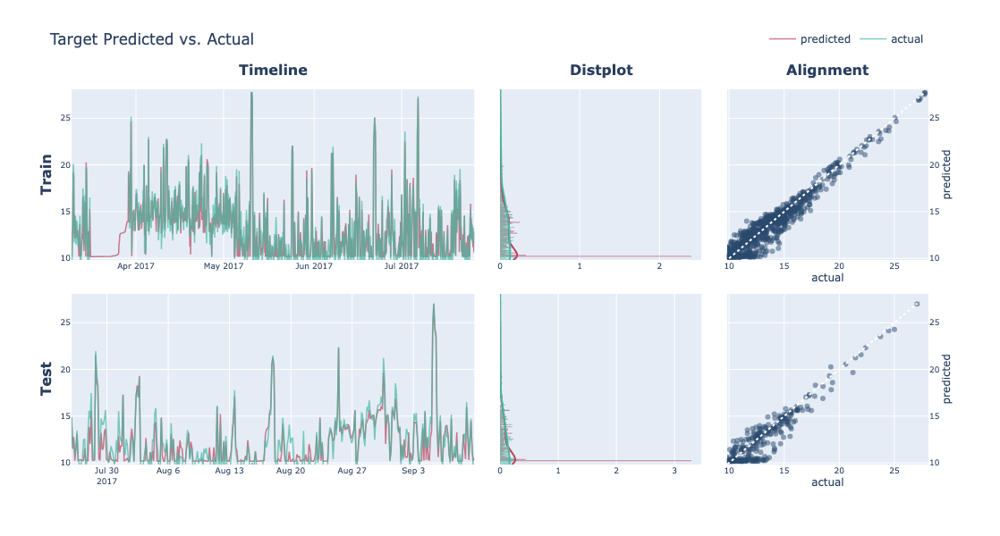

In [2]:
from modeling.report.charts import plot_actual_vs_predicted
from modeling.datasets import (
    get_trained_model,
    get_model_train_data,
    get_model_test_data,
)

model = get_trained_model()
prediction = "prediction"
train_data = get_model_train_data()
test_data = get_model_test_data()

# add predictions to datasets
train_data[prediction] = model.predict(train_data)
test_data[prediction] = model.predict(test_data)


fig = plot_actual_vs_predicted(
    train_data=train_data,
    test_data=test_data,
    target_column=model.target,
    prediction_column=prediction,
    timestamp_column="timestamp",
)
fig

## `plot_actual_vs_residuals`

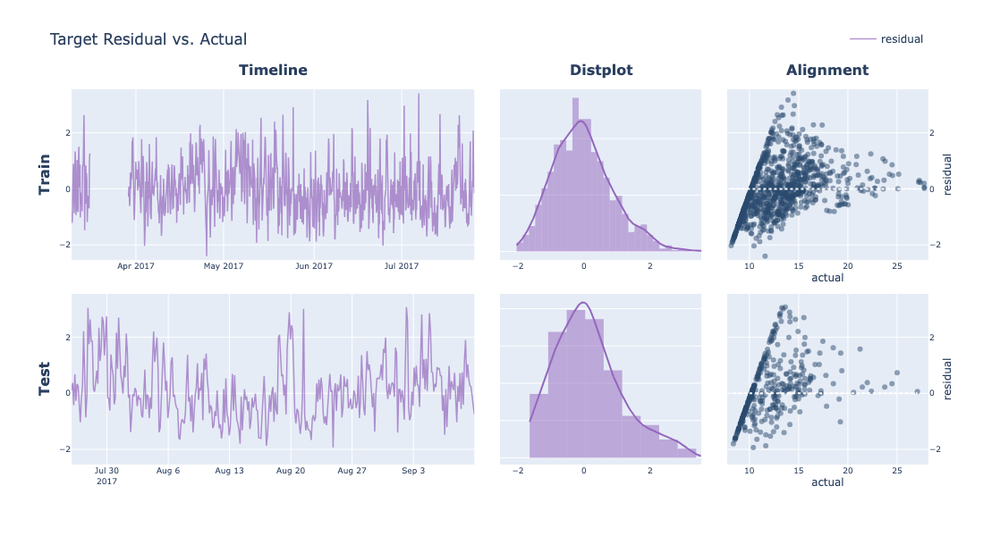

In [3]:
from modeling.report.charts import plot_actual_vs_residuals
from modeling.datasets import (
    get_trained_model,
    get_model_train_data,
    get_model_test_data,
)

model = get_trained_model()
prediction = "prediction"
train_data = get_model_train_data()
test_data = get_model_test_data()

# add predictions to datasets
train_data[prediction] = model.predict(train_data)
test_data[prediction] = model.predict(test_data)

fig = plot_actual_vs_residuals(
    train_data=train_data,
    test_data=test_data,
    target_column=model.target,
    prediction_column="prediction",
    timestamp_column="timestamp",
)
fig

## `plot_shap_summary`

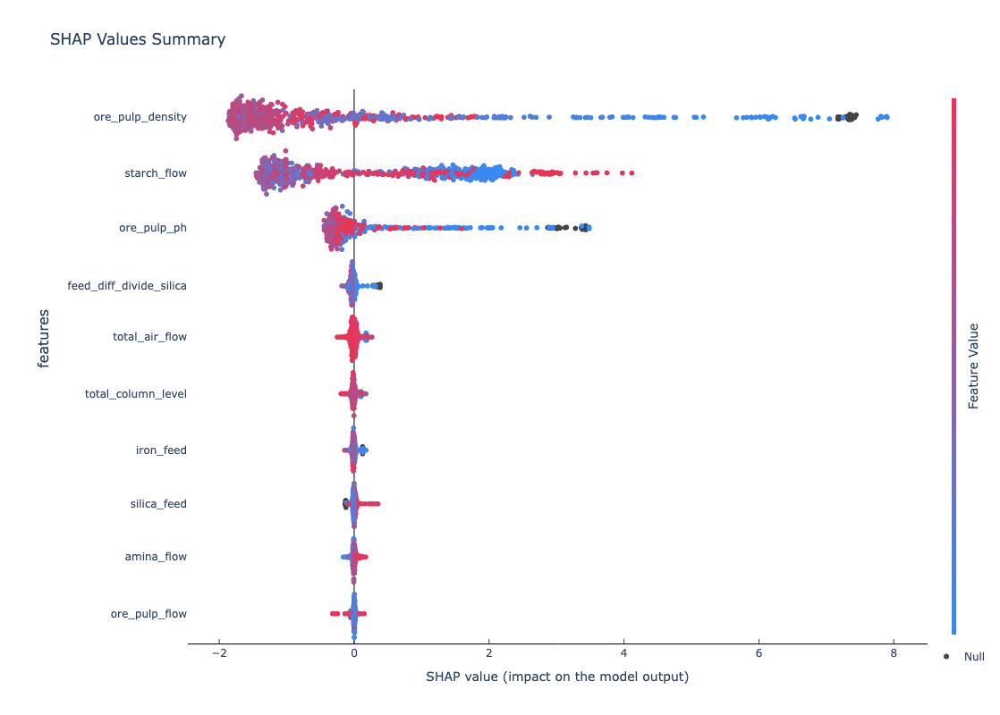

In [4]:
from modeling.datasets import get_trained_model, get_model_train_data
from modeling.report.charts import plot_shap_summary


model = get_trained_model(with_imputer=False)
train_data = get_model_train_data()
shap_explanation = model.produce_shap_explanation(train_data)
plot_shap_summary(model.features_in, shap_explanation)

## `plot_shap_dependency`

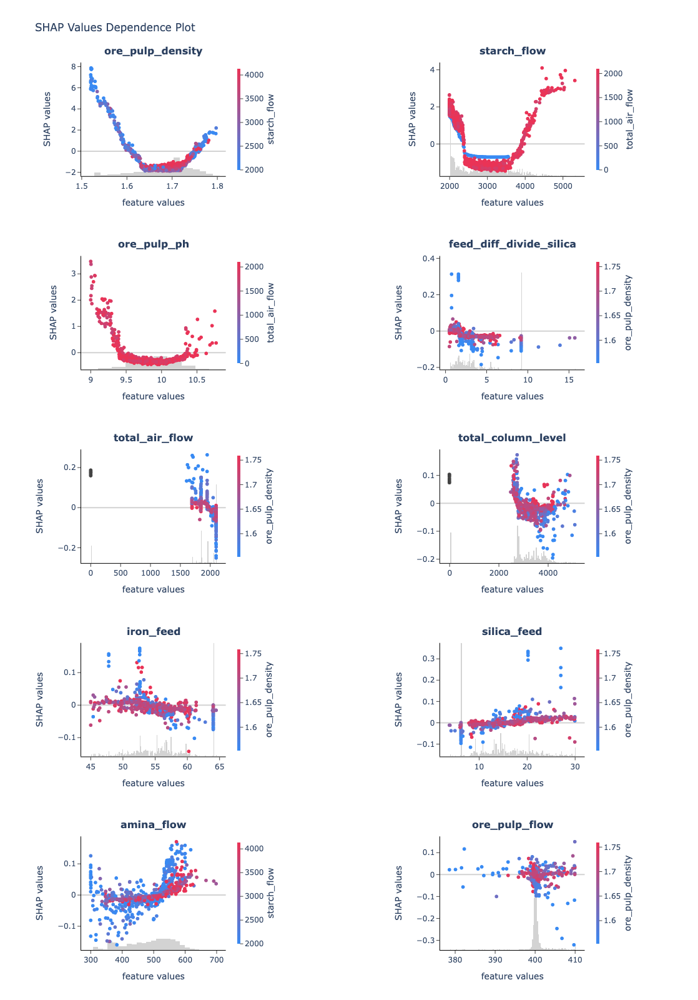

In [5]:
from modeling.datasets import get_trained_model, get_model_train_data
from modeling.report.charts import plot_shap_dependency


model = get_trained_model(with_imputer=False)
train_data = get_model_train_data()
shap_explanation = model.produce_shap_explanation(train_data)
plot_shap_dependency(model.features_in, shap_explanation)

## `plot_partial_dependency_plots`

`plot_partial_dependency_plots` requires model to implement `.predict` method and works with any type of model, not only `sklearn`-based.

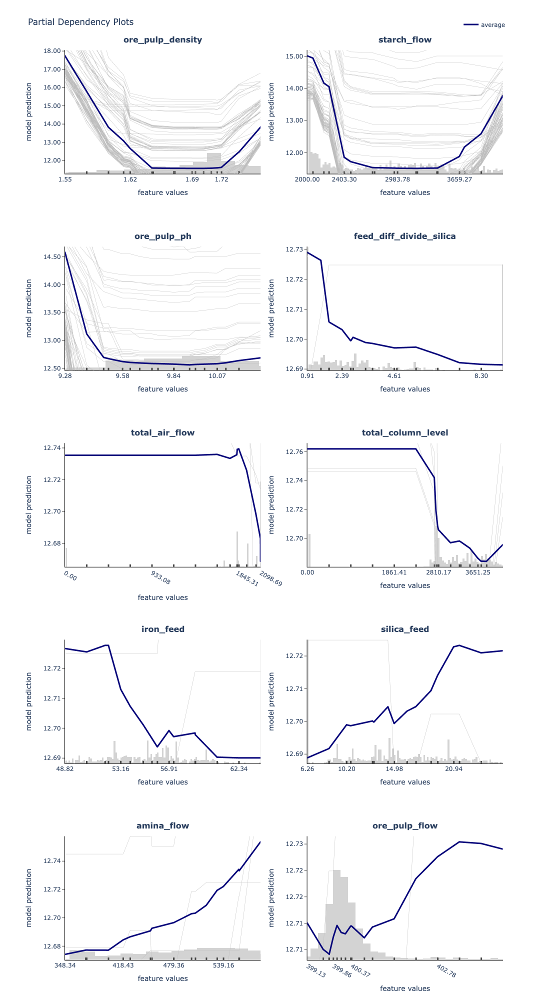

In [6]:
from modeling.report.charts import plot_partial_dependency_plots

plot_partial_dependency_plots(
    model,
    train_data.dropna(),
    feature_importance=model.get_shap_feature_importance_from_explanation(shap_explanation),
)

## `plot_partial_dependency_for_sklearn`

Set `plot_individual_lines=False` if you don't need individual lines and want to speed up calculations. Yet we recommend having individual lines to better understand relations not only in average cases.

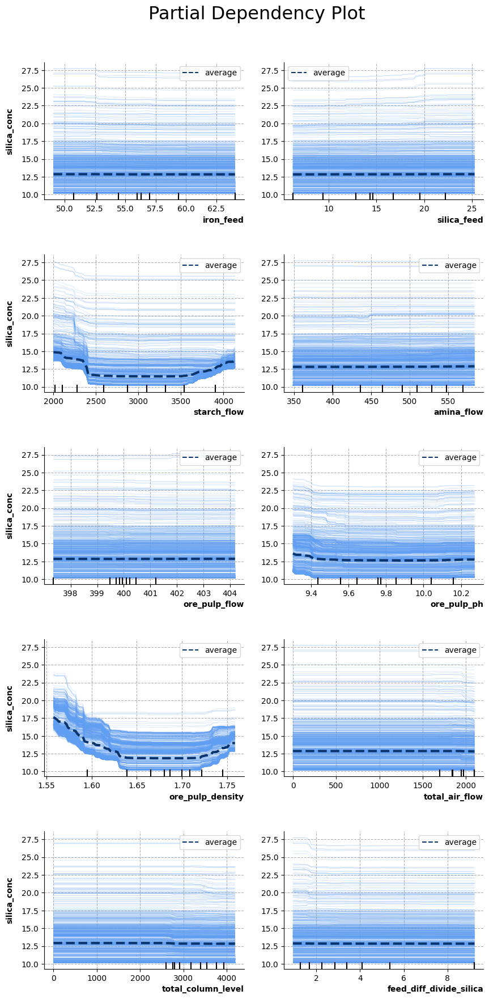

In [7]:
from modeling.datasets import get_trained_model, get_model_train_data
from modeling.report.charts import plot_partial_dependency_for_sklearn

model = get_trained_model()
train_data = get_model_train_data()

fig = plot_partial_dependency_for_sklearn(
    train_data,
    model,
    yaxis_title=model.target,
    n_jobs=-1,
)

## `get_split_details`

Returns details about split; typically used in report together with `plot_validation_representation`

In [8]:
from modeling.report.charts import get_split_details
from modeling.datasets import get_model_train_data, get_model_test_data

get_split_details(get_model_train_data(), get_model_test_data())

'train size: 1104\ntest size: 369'

## `plot_validation_representation`

This plot helps to visualise validation schema coloring `target_column` by split .

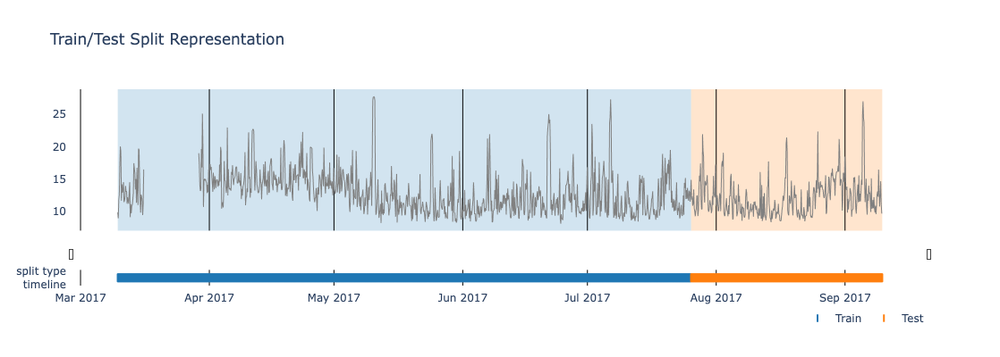

In [9]:
from modeling.report.charts import plot_validation_representation
from modeling.datasets import (
    get_trained_model,
    get_model_train_data,
    get_model_test_data,
)

plot_validation_representation(
    train_data=get_model_train_data(),
    test_data=get_model_test_data(),
    reference_column=get_trained_model().target,
    timestamp_column='timestamp',
)

### High number of splits

In case of high number of consecutive periods (usually happens when shuffled random split is performed) coloring will be limited.

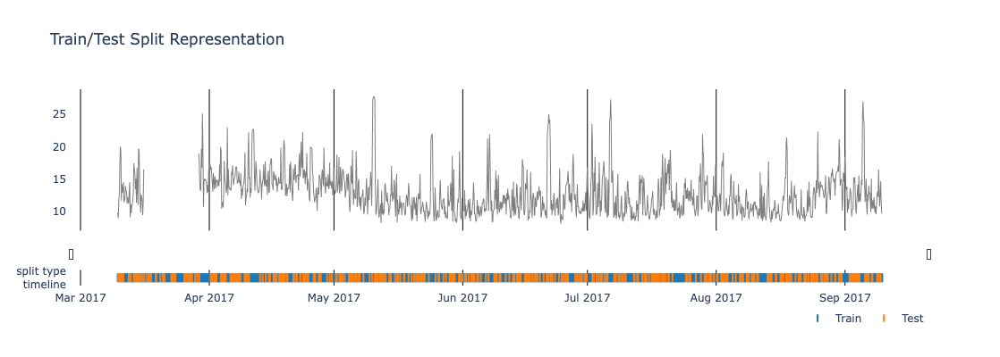

In [10]:
from sklearn.model_selection import train_test_split

from modeling.report.charts import plot_validation_representation
from modeling.datasets import get_sample_model_input_data, get_trained_model

data = get_sample_model_input_data()
train_data, test_data = train_test_split(data)

plot_validation_representation(
    train_data=train_data,
    test_data=test_data,
    reference_column=get_trained_model().target,
    timestamp_column='timestamp',
)

## `plot_consecutive_validation_periods`

This simple plot shows consecutive periods. It's usefull when you want to quickly access some specific split and need dates for that analysis.

In [11]:
from modeling.report.charts import plot_consecutive_validation_periods
from modeling.datasets import (
    get_model_train_data, get_model_test_data,
)


figs = plot_consecutive_validation_periods(
    get_model_train_data(), get_model_test_data(), "timestamp",
)
figs['Train']

'"2017-03-09 23:00:00", "2017-07-25 20:00:00"'

## `plot_feature_comparison_for_train_test`

This plot helps to spot domain shift in feature space by comparing distributions of each feature on train and test split.

It returns a dictionary with feature names as keys and comparison figures as values.

For demonstration, we'll use the first piece of mock dataset as training set and second piece as test.

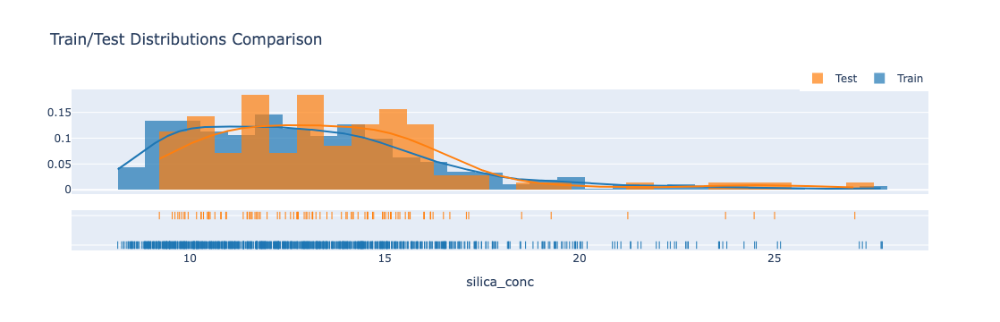

In [12]:
from modeling.report.charts import plot_feature_comparison_for_train_test
from modeling.datasets import get_sample_model_input_data

master_table = get_sample_model_input_data()
figures = plot_feature_comparison_for_train_test(
    train=master_table.head(1000), test=master_table.tail(100),
)
figures["silica_conc"]

### Comparing only subset of features

By default all columns of the dataset are used for comparison. But in practice one will want to compare only features of the model. This can be achieved by providing features set in `features`.

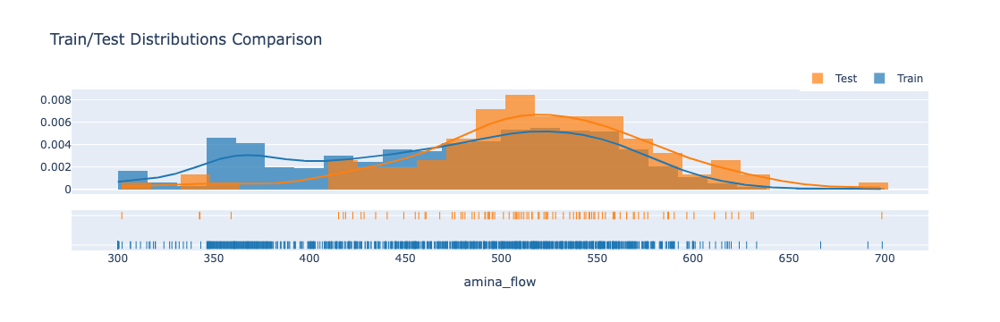

In [13]:
from modeling.report.charts import plot_feature_comparison_for_train_test
from modeling.datasets import get_sample_model_input_data, get_trained_model

master_table = get_sample_model_input_data()
figures = plot_feature_comparison_for_train_test(
    train=master_table.head(1000),
    test=master_table.tail(100),
    features=get_trained_model().features_in,
)
figures["amina_flow"]